In [1]:
from hidrocomp.series import Flow
import pandas as pd
import plotly as py

In [2]:
flow_sar = Flow(data=pd.read_csv("sar.csv", index_col=0, parse_dates=True))
flow_ons = Flow(data=pd.read_csv("ons.csv", index_col=0, parse_dates=True))
flow_sar_ons = Flow(data=flow_ons.data.combine_first(flow_sar.data["D19086"].to_frame()))

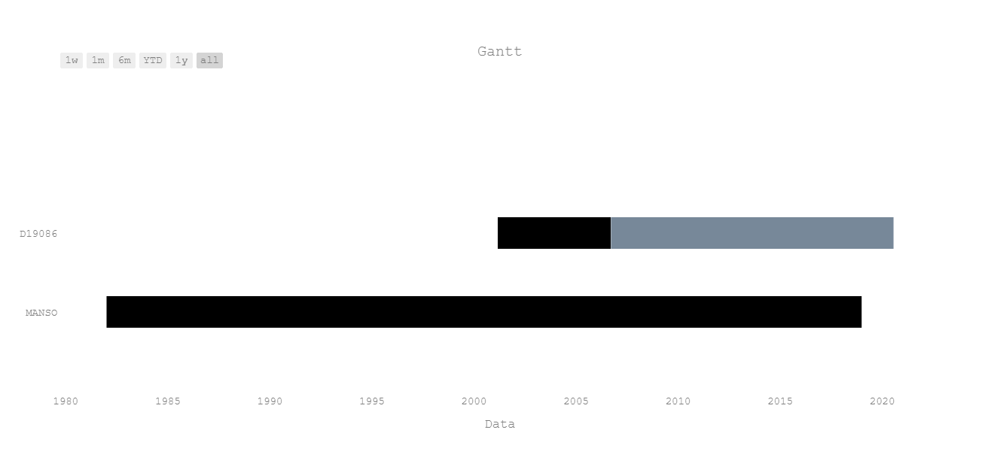

In [3]:
fig_gantt, data_gantt = flow_sar_ons.gantt("Gantt")
py.offline.iplot(fig_gantt)

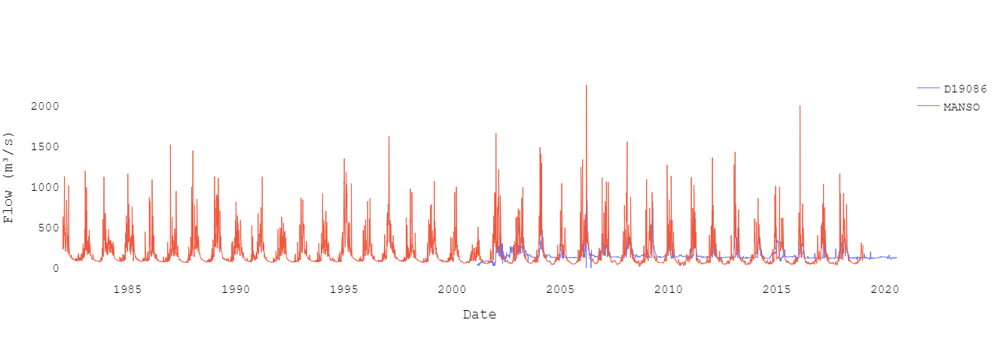

In [4]:
fig_hidro, data_hidro = flow_sar_ons.hydrogram("")
py.offline.iplot(fig_hidro)

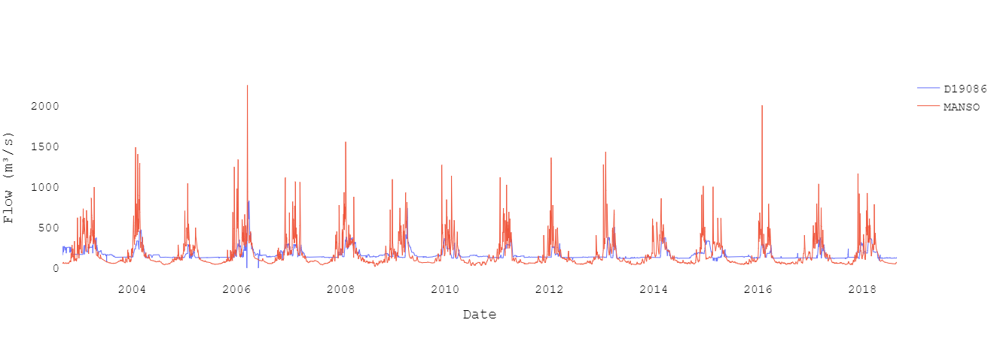

In [5]:
start_period = "01/09/2002"
end_period = "31/08/2018"
flow_sar_ons.date(date_start=start_period, date_end=end_period)
fig_start_filling_hydro, data_start_filling_hydro = flow_sar_ons.hydrogram("")
py.offline.iplot(fig_start_filling_hydro)

In [6]:
flow_ana = Flow(data=pd.read_csv("ana.csv", index_col=0, parse_dates=True))

In [7]:
nulls = flow_sar.data["D19086"].isnull()
date_start = flow_sar.data.loc[nulls].index[0] - pd.timedelta_range(start='1 day', periods=1, freq='D')
date_end = flow_sar.data.loc[nulls].index[-1]

date_range = pd.date_range(start=date_start.values[0], end=date_end)

delta = None
for date in date_range:
    if nulls[date]:
        flow_sar.data["D19086"][date] = flow_ana.data["66231000"][date] + delta
    delta = flow_sar.data["D19086"][date] - flow_ana.data["66231000"][date]

In [8]:
zeros = flow_sar.data.loc[flow_sar.data["D19086"]==0].index

for date in zeros:
    flow_sar.data["D19086"][date] = flow_ana.data["66231000"][date]

Variables:

Magnitude:
- 1-day maximum
- 1-day minimum

Duration:
- High pulse duration
- Low pulse duration

Frequency:
- High pulse count
- Low pulse count

Timing:
- Date of maximum
- Date of minimum

# Control x Impact

In [9]:
start_period = "01/09/2003"
end_period = "31/08/2018"
flow_pre = Flow(data=flow_ons.data)
flow_pre.date(date_start=start_period, date_end=end_period)

In [10]:
 # q90
threshold_high = flow_pre.quantile(0.75)[0]
f"Threshold high: {threshold_high}"

'Threshold high: 203.0'

In [11]:
# q50
threshold_low = flow_pre.quantile(0.50)[0]
f"Threshold low: {threshold_low}"

'Threshold low: 99.0'

## Manso

In [12]:
iha_pre = flow_pre.iha(status='pre', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1, 
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [13]:
iha_pre.summary()

,Coeff. of Var.,Means
1-day maximum,171.830267,650.965141
1-day minimum,8.716803,72.708306
High pulse count,3.219218,2.432432
High pulse duration,5.407837,16.688862
Low pulse count,3.139882,2.405405
Low pulse duration,20.864191,31.605608
Date of maximum,55.731293,146.497831
Date of minimum,38.167397,255.752566


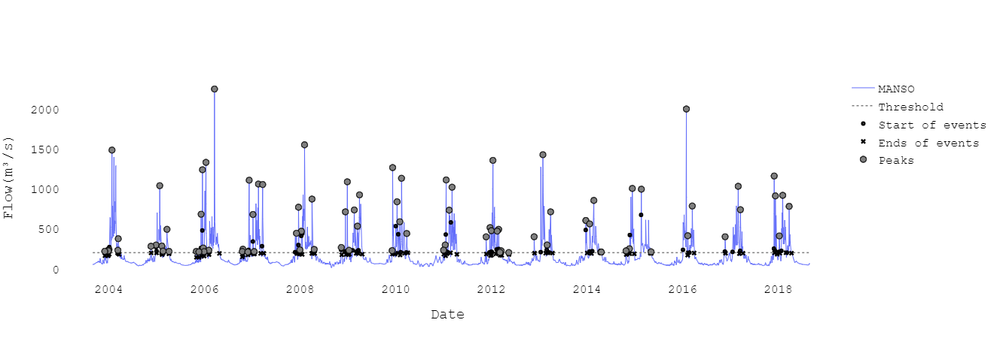

In [14]:
fig_events_high, data_events_high = iha_pre.events_high.plot_hydrogram("")
py.offline.iplot(fig_events_high)

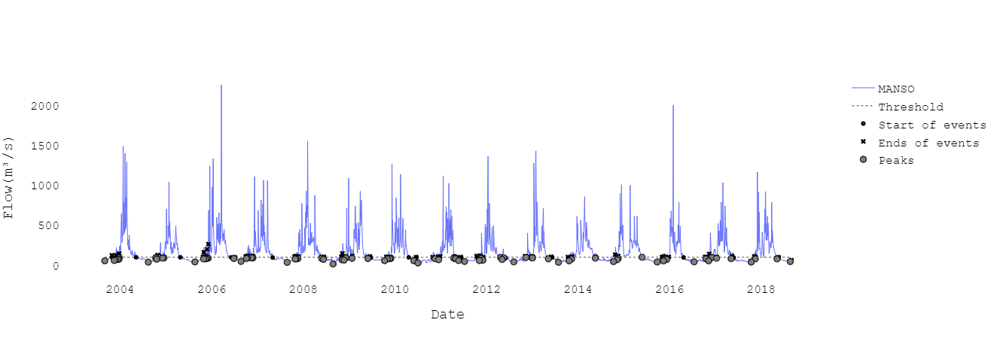

In [15]:
fig_events_low, data_events_low = iha_pre.events_low.plot_hydrogram("")
py.offline.iplot(fig_events_low)

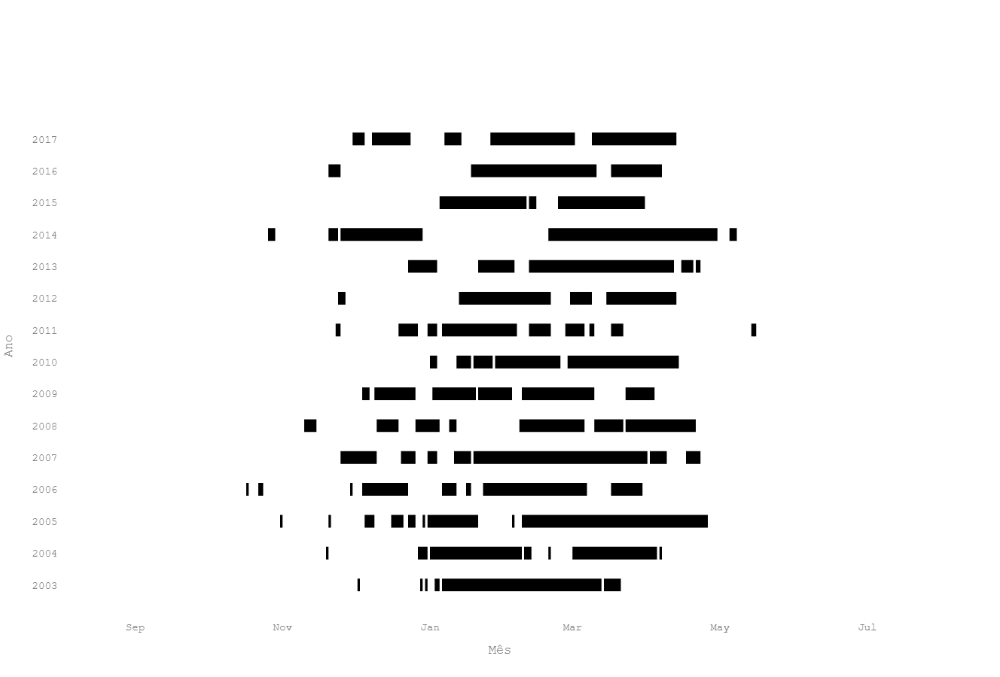

In [16]:
fig_events_high_spells, data_events_high_spells = iha_pre.events_high.plot_spells("")
py.offline.iplot(fig_events_high_spells)

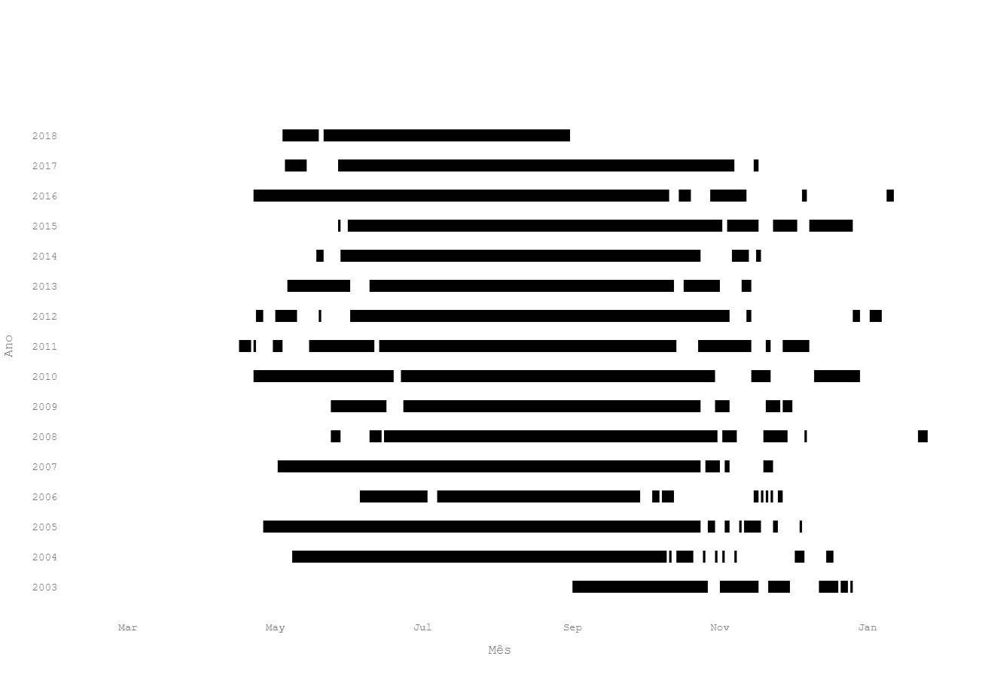

In [17]:
fig_events_low_spells, data_events_low_spells = iha_pre.events_low.plot_spells("")
py.offline.iplot(fig_events_low_spells)

# Observado

In [18]:
flow_obs = Flow(data=flow_sar.data["D19086"].to_frame())
flow_obs.date(date_start=start_period, date_end=end_period)

In [19]:
iha_pos = flow_obs.iha(status='pos', statistic="no-parametric", central_metric="mean", month_water = 9, variation_metric="std", type_threshold="stationary", 
                   threshold_high=threshold_high, threshold_low=threshold_low, type_criterion="autocorrelation", duration=1, 
                   aspects=["Magnitude and Duration", "Frequency and Duration", "Timing Extreme"], magnitude_and_duration=["1-day maximum", "1-day minimum"], 
                   timing=["Date of maximum", "Date of minimum"])

In [20]:
iha_pos.summary()

,Coeff. of Var.,Means
1-day maximum,126.551420,346.046667
1-day minimum,5.267827,89.500000
High pulse count,1.544657,2.052632
High pulse duration,18.000343,26.432222
Low pulse count,0.945905,0.315789
Low pulse duration,0.577350,1.333333
Date of maximum,57.519959,103.697778
Date of minimum,49.030603,117.000000


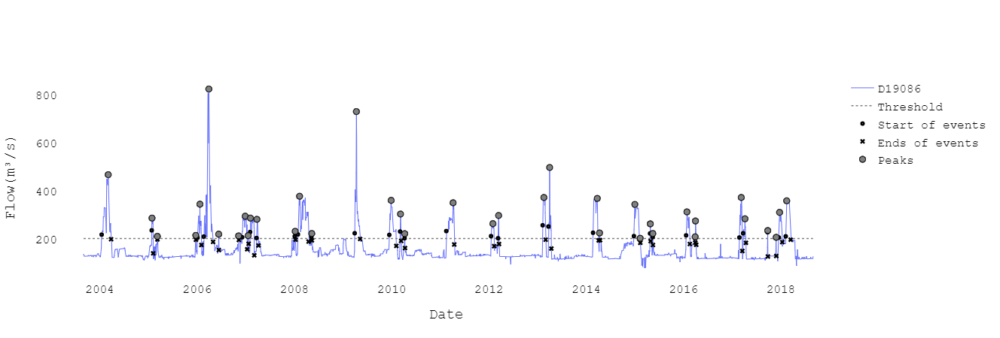

In [21]:
fig_events_high_pos, data_events_high_pos = iha_pos.events_high.plot_hydrogram("")
py.offline.iplot(fig_events_high_pos)

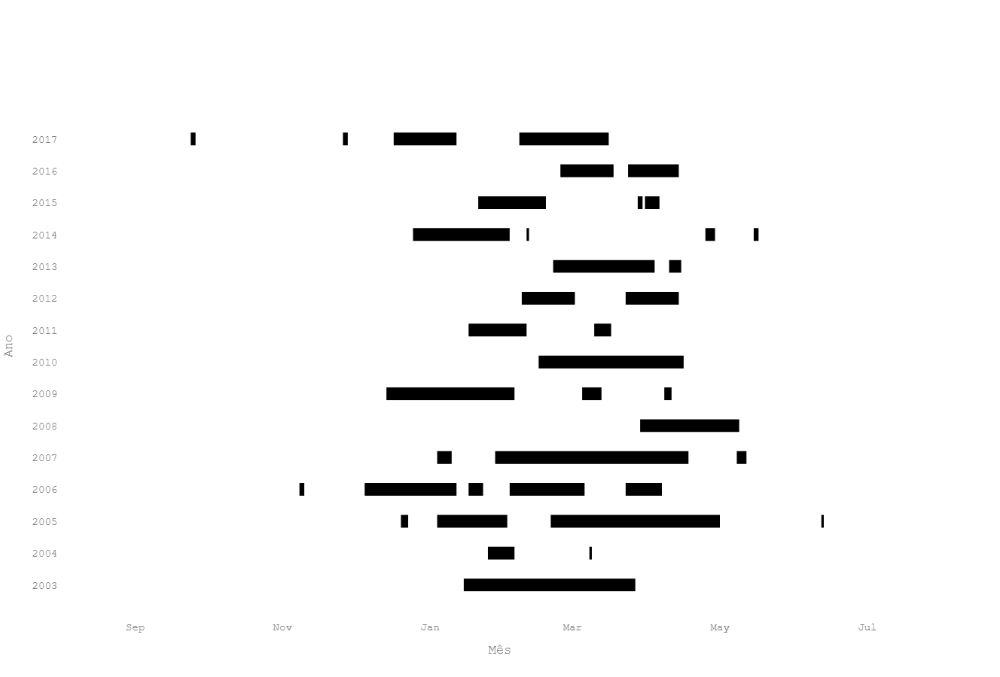

In [22]:
fig_events_high_spells_pos, data_events_high_spells_pos = iha_pos.events_high.plot_spells("")
py.offline.iplot(fig_events_high_spells_pos)

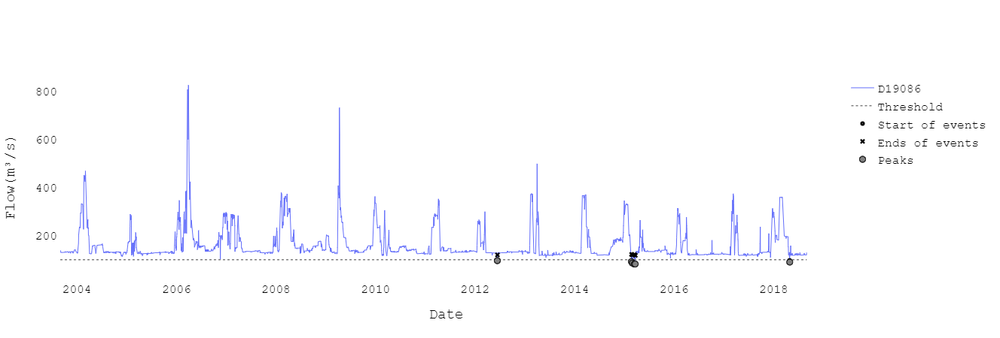

In [23]:
fig_events_low_pos, data_events_low_pos = iha_pos.events_low.plot_hydrogram("")
py.offline.iplot(fig_events_low_pos)

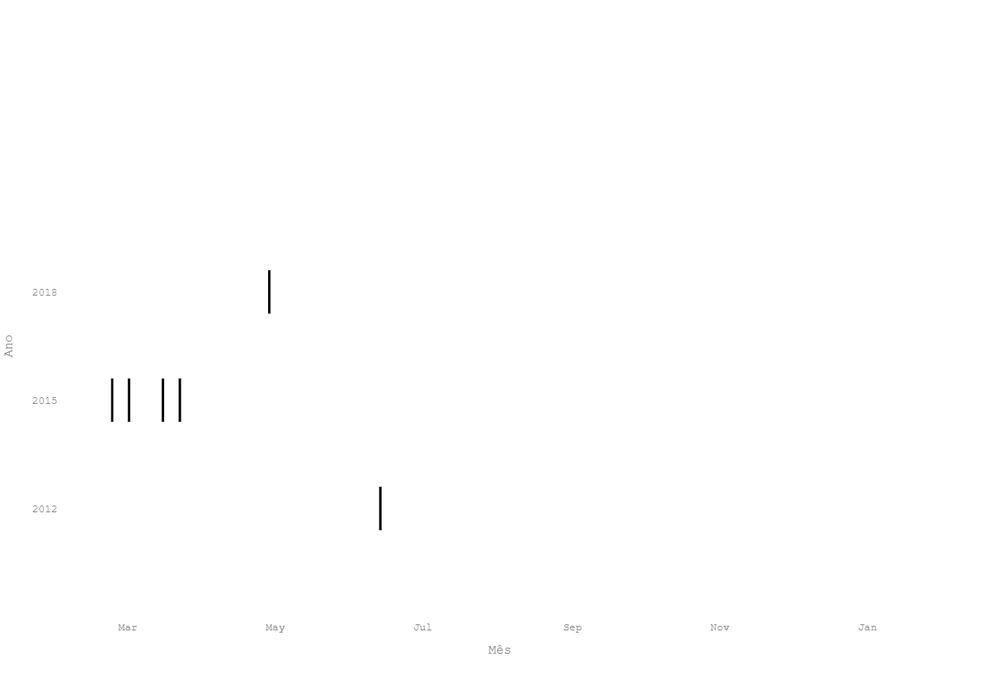

In [24]:
fig_events_low_spells_pos, data_events_low_spells_pos = iha_pos.events_low.plot_spells("")
py.offline.iplot(fig_events_low_spells_pos)

In [25]:
fig_polar_pre_high, data_polar_pre_high = iha_pre.events_high.plot_polar(title="Events High", color="#00008B")
fig_polar_pos_high, data_polar_pos_high = iha_pos.events_high.plot_polar(title="Events High", color="#00008B")

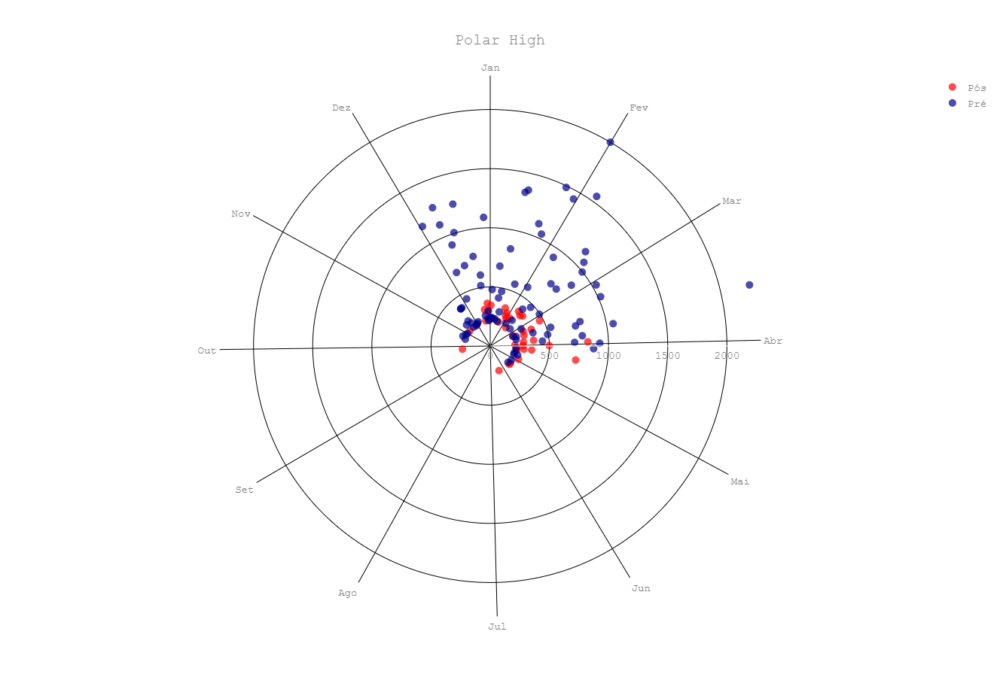

In [26]:
layout=fig_polar_pos_high['layout']

layout['title']['text'] = "Polar High"
data_polar_pos_high[0]['marker']['color'] = "red"
data_polar_pos_high[0]['name'] = "Pós"
data_polar_pre_high[0]['name'] = "Pré"
data_polar_pos_high = dict(data=data_polar_pos_high+[data_polar_pre_high[0]], layout=layout)

py.offline.iplot(data_polar_pos_high)

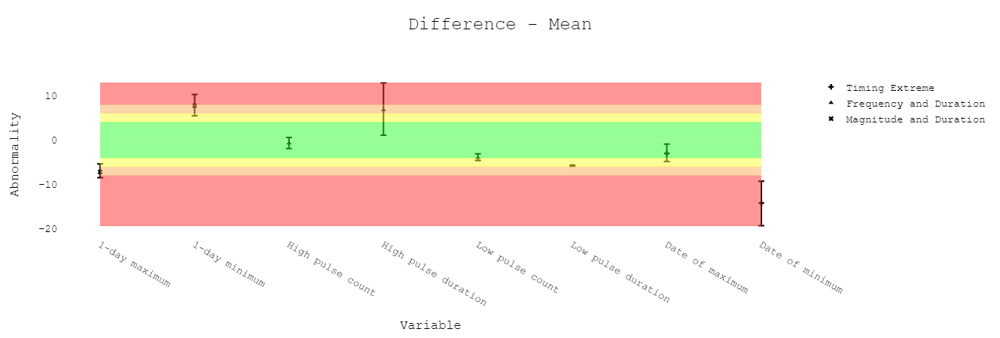

In [27]:
cha = iha_pre.cha(iha_obs=iha_pos, m=1000)
fig, data = cha.plot(data_type="mean")
py.offline.iplot(fig)

In [28]:
iha_pos.events_high.peaks.Duration.max()

80.0

In [29]:
cha.values_std()

1-day maximum          -1.368683
1-day minimum          -3.611241
Date of maximum         0.073618
Date of minimum        -0.213359
High pulse count       -6.008324
High pulse duration    14.377497
Low pulse count        -8.735946
Low pulse duration     -4.989162
Name: Pos - mean, dtype: float64

In [30]:
cha.values_mean()

1-day maximum          -7.211562
1-day minimum           7.733772
Date of maximum        -3.025331
Date of minimum       -14.238085
High pulse count       -0.710129
High pulse duration     6.791421
Low pulse count        -3.999703
Low pulse duration     -5.813541
Name: Pos - mean, dtype: float64